##2) При выполнении заданий используйте последнюю модель YOLO (YOLO11 или YOLO12)

In [ ]:
!pip install ultralytics

In [ ]:
!pip install roboflow

### a. Использование предобученной модели

In [ ]:
from ultralytics import YOLO

# Load a COCO-pretrained YOLO11m model
model = YOLO("yolo11s.pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 18.4M/18.4M [00:00<00:00, 41.3MB/s]


#### i. Найдите в Интернете или загрузите свое изображение, на котором есть как минимум два различных объекта, которые умеет предсказывать используемая версия YOLO, например, фотографию, где одновременно есть кошка и собака.

#### ii. Используйте предобученную нейросеть YOLO сделайте предсказание по найденной картинке.

In [ ]:
results = model("/content/drive/MyDrive/Университет/Компьютерное зрение/Лабораторная работа №4/data/cats and dogs.jpeg")


image 1/1 /content/drive/MyDrive/Университет/Компьютерное зрение/Лабораторная работа №4/data/cats and dogs.jpeg: 352x640 4 cats, 5 dogs, 52.4ms
Speed: 5.9ms preprocess, 52.4ms inference, 364.8ms postprocess per image at shape (1, 3, 352, 640)


#### iii. Выведите информацию о всех рамках, найденных на этапе предсказания:
1. К какому классу относится обнаруженный объект (словами)
2. Координаты левого верхнего и правого нижнего угла
ограничивающего прямоугольника с точностью два знака после
запятой
3. Уровень уверенности модели в этом предсказании

In [ ]:
for result in results:
  print("Обнаруженны следующие объекты:\n")
  for obj in result.boxes:
    print(f"Класс: {result.names[obj.cls.item()]} - Уверенность: {obj.conf.item():.4f}")
    print(f"Координаты: ({obj.xyxy[0][0].item():.0f}, {obj.xyxy[0][1].item():.0f}), ({obj.xyxy[0][2].item():.0f}, {obj.xyxy[0][3].item():.0f})\n")

Обнаруженны следующие объекты:

Класс: cat - Уверенность: 0.9197
Координаты: (1653, 383), (1996, 1003)

Класс: dog - Уверенность: 0.9011
Координаты: (1031, 393), (1374, 933)

Класс: dog - Уверенность: 0.8927
Координаты: (1251, 179), (1683, 955)

Класс: dog - Уверенность: 0.8736
Координаты: (444, 421), (792, 954)

Класс: cat - Уверенность: 0.8111
Координаты: (1438, 585), (1651, 942)

Класс: dog - Уверенность: 0.5771
Координаты: (633, 310), (1091, 963)

Класс: cat - Уверенность: 0.4428
Координаты: (633, 310), (1088, 963)

Класс: dog - Уверенность: 0.4016
Координаты: (56, 598), (466, 941)

Класс: cat - Уверенность: 0.2968
Координаты: (233, 600), (466, 941)



#### iv. Отобразите найденный результат графически, на исходном изображении должны быть выведены найденные рамки.

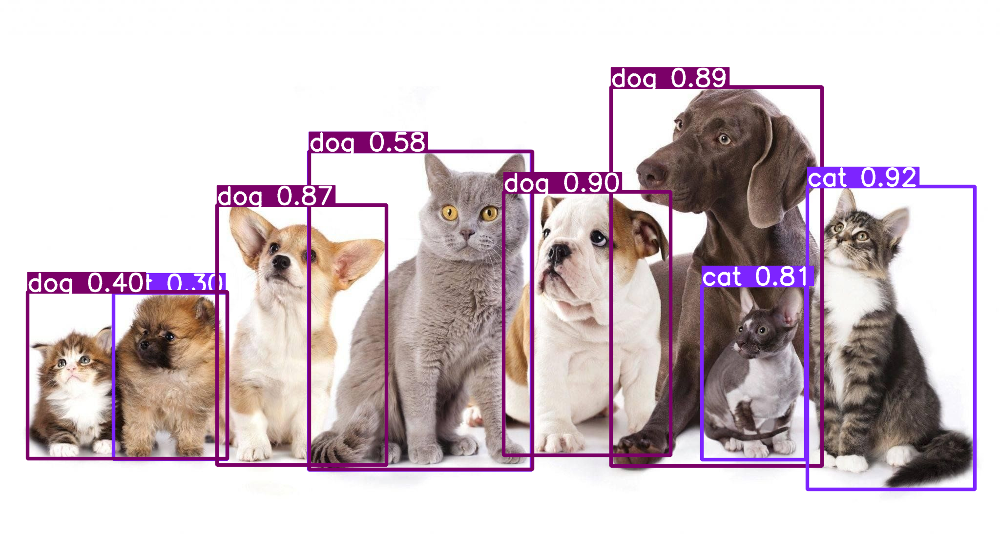

In [ ]:
for result in results:
  result.show()

## c. Обучите модель YOLO обнаруживать аннотированные части объектов в полученном наборе данных.

In [ ]:
from roboflow import Roboflow

rf = Roboflow(api_key="api_key")
project = rf.workspace("cv-mcbj1").project("mask-wearing-ljrsw")
version = project.version(3)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Mask-Wearing-3 in yolov11:: 100%|██████████| 8468/8468 [00:01<00:00, 8412.92it/s]


In [ ]:
results = model.train(data="/content/Mask-Wearing-3/data.yaml",
                      epochs=10,
                      batch=30
                      )

Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11s.pt, data=/content/Mask-Wearing-3/data.yaml, epochs=10, time=None, patience=100, batch=30, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, sho

100%|██████████| 755k/755k [00:00<00:00, 101MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 216MB/s]


AMP: checks passed ✅


train: Scanning /content/Mask-Wearing-3/train/labels... 3432 images, 477 backgrounds, 0 corrupt: 100%|██████████| 3432/3432 [00:01<00:00, 2368.63it/s]


train: New cache created: /content/Mask-Wearing-3/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/Mask-Wearing-3/test/labels... 798 images, 128 backgrounds, 0 corrupt: 100%|██████████| 798/798 [00:01<00:00, 767.07it/s]


val: New cache created: /content/Mask-Wearing-3/test/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.00046875), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      8.35G      1.848      2.958      1.971         80        640: 100%|██████████| 115/115 [01:09<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:09<00:00,  1.41it/s]


                   all        798       1713      0.686      0.553      0.617      0.315

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      11.2G      1.489      1.575      1.546         25        640: 100%|██████████| 115/115 [01:03<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:08<00:00,  1.57it/s]


                   all        798       1713      0.738       0.66      0.717      0.411

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      11.3G      1.396      1.196      1.475         14        640: 100%|██████████| 115/115 [01:03<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:08<00:00,  1.72it/s]


                   all        798       1713      0.793      0.679       0.74      0.401

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      11.3G      1.364      1.058      1.455         13        640: 100%|██████████| 115/115 [01:04<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:07<00:00,  1.79it/s]

                   all        798       1713       0.83      0.689       0.76      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      11.3G      1.282     0.9199       1.38         13        640: 100%|██████████| 115/115 [01:04<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:08<00:00,  1.72it/s]

                   all        798       1713      0.838      0.715      0.801      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      11.4G      1.204     0.8473      1.326         25        640: 100%|██████████| 115/115 [01:04<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:08<00:00,  1.57it/s]

                   all        798       1713      0.869      0.771      0.849      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      11.4G      1.131     0.7396      1.268         19        640: 100%|██████████| 115/115 [01:03<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:08<00:00,  1.61it/s]

                   all        798       1713      0.884      0.762      0.854      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      11.4G      1.071     0.6864      1.236         15        640: 100%|██████████| 115/115 [01:04<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:08<00:00,  1.63it/s]

                   all        798       1713      0.861      0.801      0.862      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      11.5G     0.9963     0.6027      1.185         13        640: 100%|██████████| 115/115 [01:05<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:07<00:00,  1.81it/s]

                   all        798       1713      0.898      0.803       0.88      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      11.5G     0.9438     0.5591      1.153         10        640: 100%|██████████| 115/115 [01:05<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:07<00:00,  1.79it/s]

                   all        798       1713      0.921      0.829      0.893       0.59



10 epochs completed in 0.208 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 19.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 19.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,413,574 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:10<00:00,  1.32it/s]


                   all        798       1713      0.921      0.831      0.892       0.59
                  mask        388       1209      0.902      0.834      0.895      0.554
               no-mask        341        504      0.939      0.828      0.889      0.626
Speed: 0.2ms preprocess, 4.9ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/detect/train


In [ ]:
import pandas as pd

val_precision = pd.read_csv("/content/runs/detect/train/results.csv")
val_precision.head()

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,85.1049,1.84825,2.95757,1.97065,0.68617,0.55305,0.61681,0.31534,1.64151,2.19042,1.67407,0.000551,0.000551,0.000551
1,2,158.4300,1.48857,1.57530,1.54602,0.73796,0.65986,0.71684,0.41149,1.45220,1.79393,1.47536,0.000997,0.000997,0.000997
2,3,230.9920,1.39563,1.19646,1.47527,0.79343,0.67903,0.73993,0.40087,1.58400,1.56203,1.58000,0.001333,0.001333,0.001333
3,4,304.1380,1.36440,1.05780,1.45501,0.82964,0.68919,0.75998,0.44094,1.47625,1.29094,1.52115,0.001172,0.001172,0.001172
4,5,377.9870,1.28199,0.91987,1.37973,0.83774,0.71545,0.80080,0.44594,1.50196,1.11062,1.48855,0.001007,0.001007,0.001007


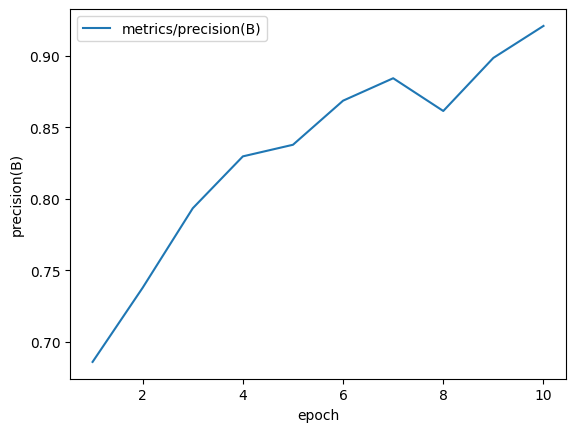

In [ ]:
import matplotlib.pyplot as plt

val_precision.plot(x="epoch", y="metrics/precision(B)")
plt.xlabel('epoch')
plt.ylabel('precision(B)')
plt.show()

In [ ]:
import shutil

shutil.copyfile("/content/runs/detect/train/weights/best.pt", "/content/drive/MyDrive/Университет/Компьютерное зрение/Лабораторная работа №4/best_weights/best.pt")

'/content/drive/MyDrive/Университет/Компьютерное зрение/Лабораторная работа №4/best_weights/best.pt'

In [ ]:
best_model = YOLO("/content/drive/MyDrive/Университет/Компьютерное зрение/Лабораторная работа №4/best_weights/best.pt")


image 1/1 /content/drive/MyDrive/Университет/Компьютерное зрение/Лабораторная работа №4/data/dataset/mask1.jpg: 448x640 3 masks, 19.0ms
Speed: 8.7ms preprocess, 19.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)


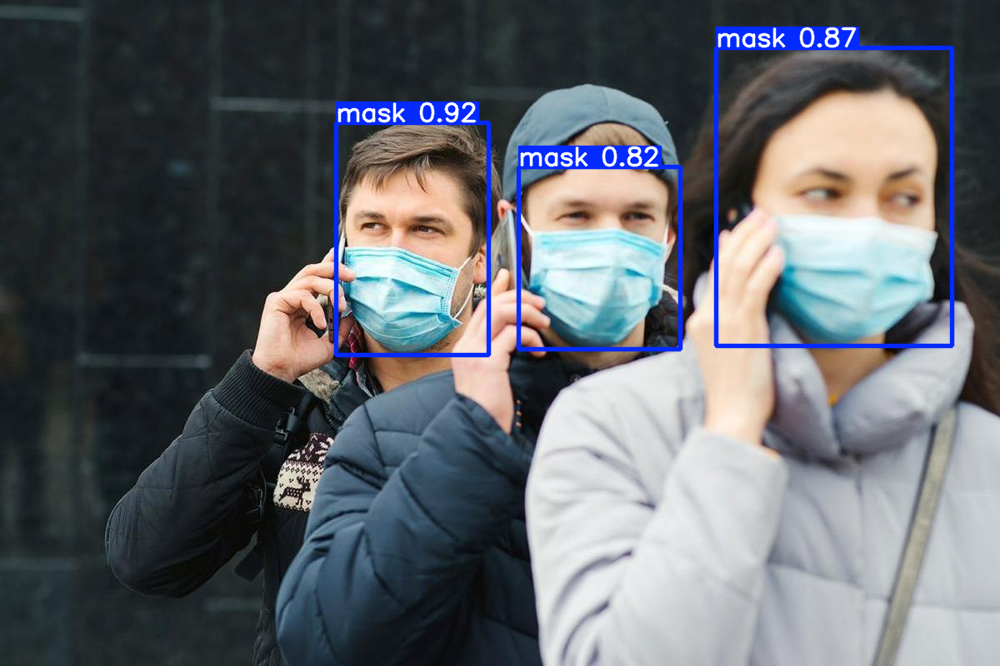


image 1/1 /content/drive/MyDrive/Университет/Компьютерное зрение/Лабораторная работа №4/data/dataset/mask2.jpg: 448x640 6 masks, 12.3ms
Speed: 4.1ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


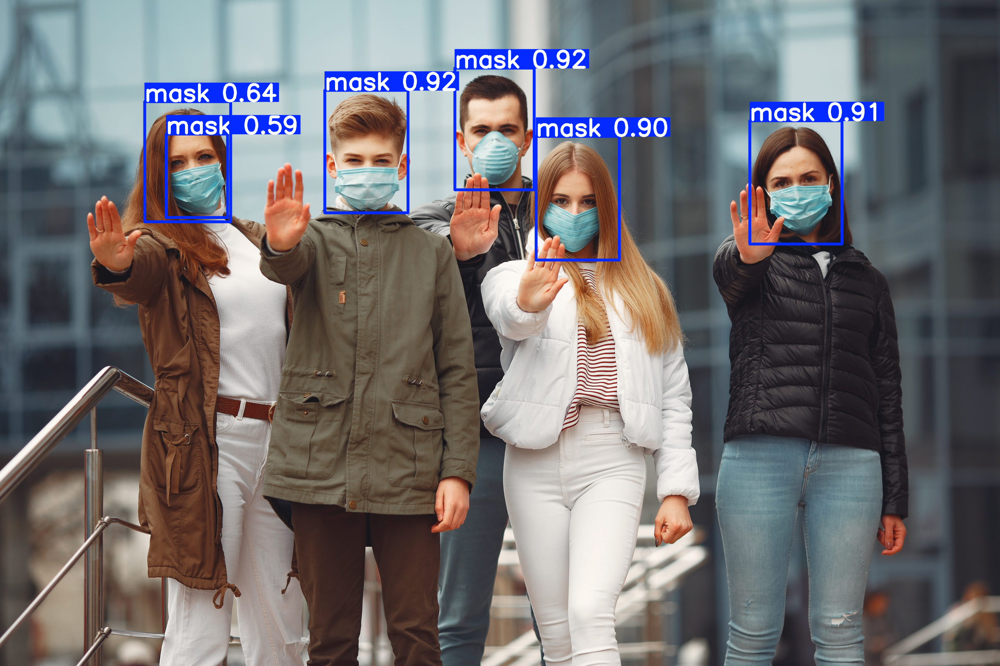


image 1/1 /content/drive/MyDrive/Университет/Компьютерное зрение/Лабораторная работа №4/data/dataset/mask3.jpg: 384x640 1 mask, 1 no-mask, 51.4ms
Speed: 12.5ms preprocess, 51.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


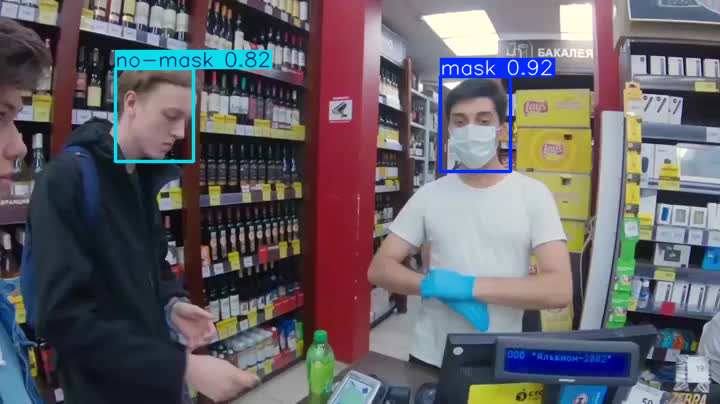


image 1/1 /content/drive/MyDrive/Университет/Компьютерное зрение/Лабораторная работа №4/data/dataset/mask4.jpg: 320x640 1 mask, 32.8ms
Speed: 10.6ms preprocess, 32.8ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 640)


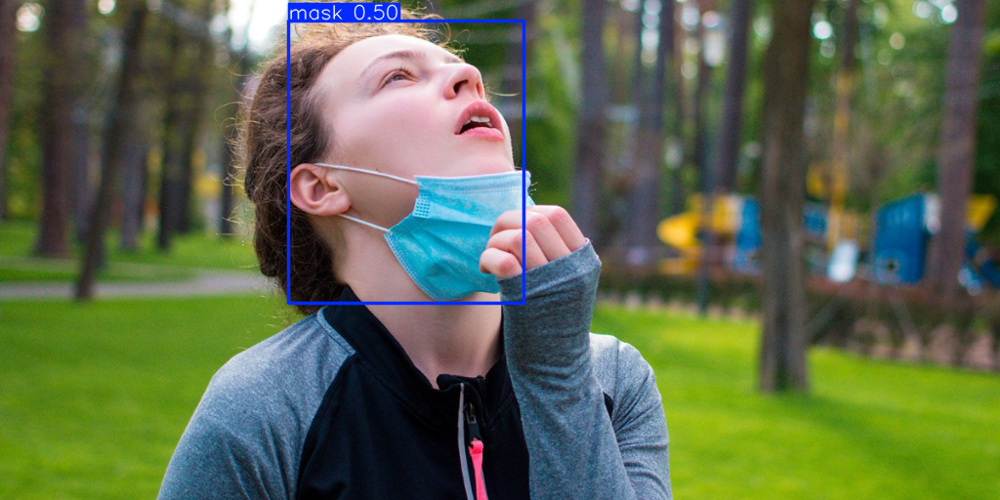


image 1/1 /content/drive/MyDrive/Университет/Компьютерное зрение/Лабораторная работа №4/data/dataset/mask5.jpg: 384x640 4 masks, 6 no-masks, 19.5ms
Speed: 3.1ms preprocess, 19.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


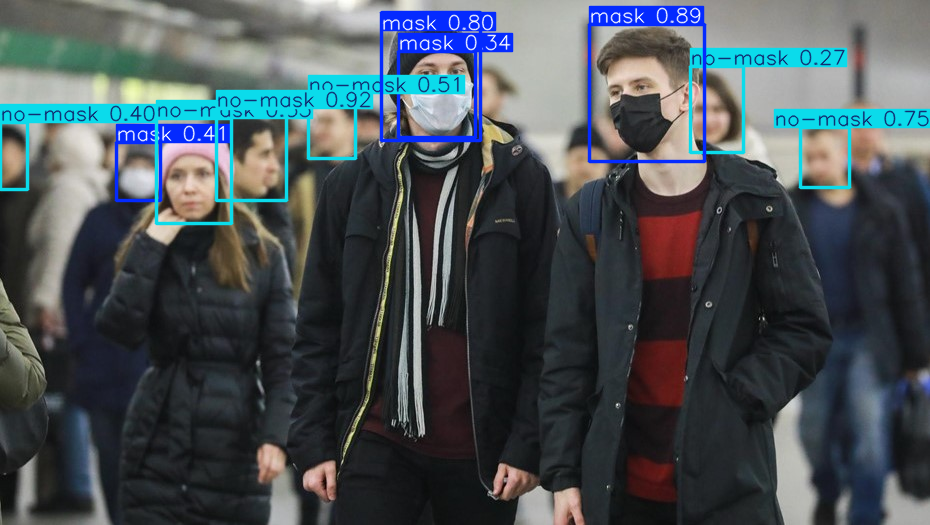

In [ ]:
import os

path = "/content/drive/MyDrive/Университет/Компьютерное зрение/Лабораторная работа №4/data/dataset"

for image in os.listdir(path):
  results = best_model(f"{path}/{image}")
  for result in results:
    result.show()